# How to find a local peak

Explain the way to find local peaks from impedance magnitude data.
As an example, side-hole mensur is studied here.

scipy.signal argrelextrema is very useful to find stationary point from given data.

In [1]:
using PyCall

In [8]:
@pyimport numpy as np
@pyimport scipy.signal as sg

In [10]:
using DataFrames, DataFramesMeta
using Plots, StatPlots

┌ Info: Precompiling StatPlots [60ddc479-9b66-56df-82fc-76a74619b69c]
└ @ Base loading.jl:1189


Mensur which has a side-hole ( a.k.a tone-hole ) would give a strange pattern of extremas.

In [9]:
run(`cat side-hole.xmen`)

# to demonstrate peak search
[
    10,10,250,
    |,SH,1,
    10,10,750,
    OPEN_END
]

{,SH
6,6,3,
OPEN_END
}


Process(`cat side-hole.xmen`, ProcessExited(0))

In [13]:
include("../../src/calcimp.jl")
import .Calcimp

In [14]:
impd = Calcimp.calcimp("side-hole.xmen");

,frq,imp,mag
1,0.0,0.0+0.0im,-Inf
2,2.5,0.837913+5.89386im,15.4949
3,5.0,1.24593+11.2301im,21.0608
4,7.5,1.56327+16.4708im,24.3732
5,10.0,1.83326+21.6654im,26.7463
6,12.5,2.07321+26.834im,28.5995
7,15.0,2.29216+31.9877im,30.1219
8,17.5,2.49557+37.1338im,31.415
9,20.0,2.68705+42.2774im,32.5397
10,22.5,2.86915+47.4228im,33.5356


This impedance curve is weird to do peak search due to side-hole.

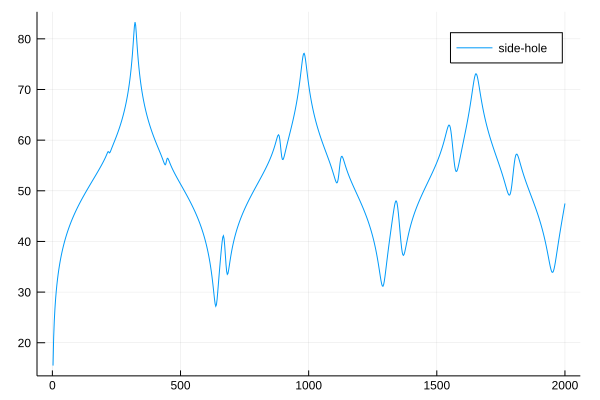

In [16]:
plot(impd[:frq], impd[:mag], label="side-hole")

Find peak numbers using argrelextrema.

In [35]:
pks = sg.argrelextrema(impd[:mag],np.greater)[1]

11-element Array{Int64,1}:
  87
 129
 180
 267
 353
 393
 452
 536
 619
 661
 725

Python is 0-based index while Julia is 1-based, so that number must be shifted.

In [36]:
pks .+= 1

11-element Array{Int64,1}:
  88
 130
 181
 268
 354
 394
 453
 537
 620
 662
 726

In [38]:
pkd = impd[pks,:]

,frq,imp,mag
1,217.5,97.6572+764.517im,57.738
2,322.5,14611.7+605.14im,83.3015
3,450.0,154.272-644.233im,56.423
4,667.5,105.194+43.7322im,41.1322
5,882.5,634.837+934.535im,61.0598
6,982.5,7166.67-561.04im,77.1329
7,1130.0,369.095-586.12im,56.8103
8,1340.0,228.529+103.235im,47.9853
9,1547.5,1105.13+874.059im,62.9782
10,1652.5,4522.8+45.1858im,73.1086


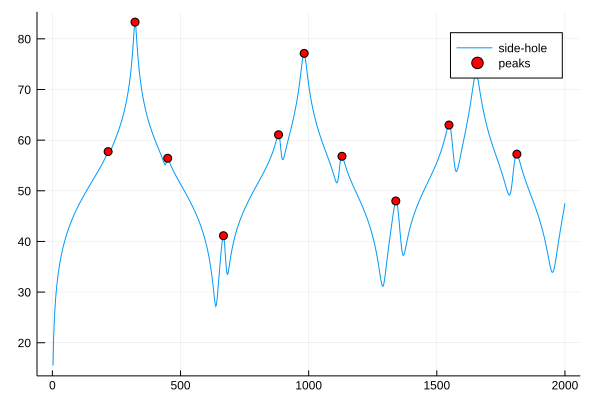

In [51]:
plot(impd[:frq], impd[:mag], label="side-hole")
scatter!(pkd[:frq],pkd[:mag], color = "red", label="peaks")

In case of searching local minima, use np.less.

In [54]:
mins = sg.argrelextrema(impd[:mag],np.less)[1] .+ 1

11-element Array{Int64,1}:
  90
 177
 256
 274
 361
 445
 517
 549
 632
 714
 782

In [55]:
mind = impd[mins,:]

,frq,imp,mag
1,222.5,110.016+740.224im,57.4822
2,440.0,140.709-553.567im,55.1353
3,637.5,22.503-4.31894im,27.2019
4,682.5,40.7857+23.9325im,33.4952
5,900.0,347.157+541.649im,56.169
6,1110.0,212.982-312.813im,51.5598
7,1290.0,36.0728-1.85477im,31.1551
8,1370.0,63.3855+35.9662im,37.252
9,1577.5,394.079+293.43im,53.8274
10,1782.5,210.208-194.659im,49.1424


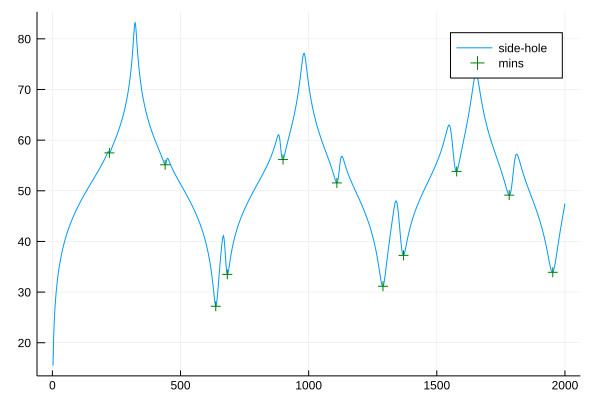

In [67]:
plot(impd[:frq], impd[:mag], label="side-hole")
scatter!(mind[:frq],mind[:mag], label="mins", markerstrokecolor = :green, markershape = :+)